Create paired IR/visible image patches from SEVIRI for the nightvision challenge

We want a good range of patches. 365x24 = 8760 so process hourly data for 1 year (2019)?

In [7]:
! ls /gws/nopw/j04/eo_shared_data_vol1/satellite/seviri/Data/2019/12/31

MSG4-SEVI-MSG15-0100-NA-20191231001244.114000000Z-NA.nat
MSG4-SEVI-MSG15-0100-NA-20191231002743.010000000Z-NA.nat
MSG4-SEVI-MSG15-0100-NA-20191231004243.110000000Z-NA.nat
MSG4-SEVI-MSG15-0100-NA-20191231005743.212000000Z-NA.nat
MSG4-SEVI-MSG15-0100-NA-20191231011243.313000000Z-NA.nat
MSG4-SEVI-MSG15-0100-NA-20191231012743.414000000Z-NA.nat
MSG4-SEVI-MSG15-0100-NA-20191231014243.515000000Z-NA.nat
MSG4-SEVI-MSG15-0100-NA-20191231015743.617000000Z-NA.nat
MSG4-SEVI-MSG15-0100-NA-20191231021243.718000000Z-NA.nat
MSG4-SEVI-MSG15-0100-NA-20191231022743.820000000Z-NA.nat
MSG4-SEVI-MSG15-0100-NA-20191231024243.921000000Z-NA.nat
MSG4-SEVI-MSG15-0100-NA-20191231025744.023000000Z-NA.nat
MSG4-SEVI-MSG15-0100-NA-20191231031244.125000000Z-NA.nat
MSG4-SEVI-MSG15-0100-NA-20191231032743.021000000Z-NA.nat
MSG4-SEVI-MSG15-0100-NA-20191231034243.124000000Z-NA.nat
MSG4-SEVI-MSG15-0100-NA-20191231035743.226000000Z-NA.nat
MSG4-SEVI-MSG15-0100-NA-20191231041243.329000000Z-NA.nat
MSG4-SEVI-MSG15-0100-NA-2019123

In [8]:
import pathlib

In [9]:
seviri_path = pathlib.Path("/gws/nopw/j04/eo_shared_data_vol1/satellite/seviri/Data")

In [10]:
import pandas as pd

In [11]:
from datetime import datetime, timedelta

In [15]:
pd.date_range(datetime(2019,1,1), datetime(2019,1,3), freq="h", inclusive="left").to_pydatetime()

array([datetime.datetime(2019, 1, 1, 0, 0),
       datetime.datetime(2019, 1, 1, 1, 0),
       datetime.datetime(2019, 1, 1, 2, 0),
       datetime.datetime(2019, 1, 1, 3, 0),
       datetime.datetime(2019, 1, 1, 4, 0),
       datetime.datetime(2019, 1, 1, 5, 0),
       datetime.datetime(2019, 1, 1, 6, 0),
       datetime.datetime(2019, 1, 1, 7, 0),
       datetime.datetime(2019, 1, 1, 8, 0),
       datetime.datetime(2019, 1, 1, 9, 0),
       datetime.datetime(2019, 1, 1, 10, 0),
       datetime.datetime(2019, 1, 1, 11, 0),
       datetime.datetime(2019, 1, 1, 12, 0),
       datetime.datetime(2019, 1, 1, 13, 0),
       datetime.datetime(2019, 1, 1, 14, 0),
       datetime.datetime(2019, 1, 1, 15, 0),
       datetime.datetime(2019, 1, 1, 16, 0),
       datetime.datetime(2019, 1, 1, 17, 0),
       datetime.datetime(2019, 1, 1, 18, 0),
       datetime.datetime(2019, 1, 1, 19, 0),
       datetime.datetime(2019, 1, 1, 20, 0),
       datetime.datetime(2019, 1, 1, 21, 0),
       datetime.date

In [48]:
files = []

for date in pd.date_range(datetime(2019,7,1), datetime(2019,7,3), freq="h", inclusive="left").to_pydatetime():
    seviri_files = sorted(list((seviri_path / date.strftime("%Y/%m/%d")).glob(
        f'MSG[1234]-SEVI-MSG15-0100-NA-{date.strftime("%Y%m%d%H")}*-NA.nat'
    )))
    if len(seviri_files):
        files.append(seviri_files[0])

In [49]:
files

[PosixPath('/gws/nopw/j04/eo_shared_data_vol1/satellite/seviri/Data/2019/07/01/MSG4-SEVI-MSG15-0100-NA-20190701001243.039000000Z-NA.nat'),
 PosixPath('/gws/nopw/j04/eo_shared_data_vol1/satellite/seviri/Data/2019/07/01/MSG4-SEVI-MSG15-0100-NA-20190701011242.845000000Z-NA.nat'),
 PosixPath('/gws/nopw/j04/eo_shared_data_vol1/satellite/seviri/Data/2019/07/01/MSG4-SEVI-MSG15-0100-NA-20190701021242.632000000Z-NA.nat'),
 PosixPath('/gws/nopw/j04/eo_shared_data_vol1/satellite/seviri/Data/2019/07/01/MSG4-SEVI-MSG15-0100-NA-20190701031242.398000000Z-NA.nat'),
 PosixPath('/gws/nopw/j04/eo_shared_data_vol1/satellite/seviri/Data/2019/07/01/MSG4-SEVI-MSG15-0100-NA-20190701041242.140000000Z-NA.nat'),
 PosixPath('/gws/nopw/j04/eo_shared_data_vol1/satellite/seviri/Data/2019/07/01/MSG4-SEVI-MSG15-0100-NA-20190701051243.063000000Z-NA.nat'),
 PosixPath('/gws/nopw/j04/eo_shared_data_vol1/satellite/seviri/Data/2019/07/01/MSG4-SEVI-MSG15-0100-NA-20190701061242.754000000Z-NA.nat'),
 PosixPath('/gws/nopw/j04/e

In [50]:
from satpy import Scene

In [51]:
scn = Scene([files[6]], reader="seviri_l1b_native")

In [52]:
scn.all_dataset_names()

['HRV',
 'IR_016',
 'IR_039',
 'IR_087',
 'IR_097',
 'IR_108',
 'IR_120',
 'IR_134',
 'VIS006',
 'VIS008',
 'WV_062',
 'WV_073']

In [53]:
scn.all_composite_names()

['airmass',
 'ash',
 'cloud_phase_distinction',
 'cloud_phase_distinction_raw',
 'cloudtop',
 'cloudtop_daytime',
 'colorized_ir_clouds',
 'convection',
 'day_microphysics',
 'day_microphysics_winter',
 'dust',
 'fog',
 'green_snow',
 'hrv_clouds',
 'hrv_fog',
 'hrv_severe_storms',
 'hrv_severe_storms_masked',
 'ir108_3d',
 'ir_cloud_day',
 'ir_overview',
 'ir_sandwich',
 'natural_color',
 'natural_color_nocorr',
 'natural_color_raw',
 'natural_color_raw_with_night_ir',
 'natural_color_with_night_ir',
 'natural_color_with_night_ir_hires',
 'natural_enh',
 'natural_enh_with_night_ir',
 'natural_enh_with_night_ir_hires',
 'natural_with_night_fog',
 'night_fog',
 'night_ir_alpha',
 'night_ir_with_background',
 'night_ir_with_background_hires',
 'night_microphysics',
 'overview',
 'overview_raw',
 'realistic_colors',
 'rocket_plume_day',
 'rocket_plume_night',
 'snow',
 'vis_sharpened_ir']

In [94]:
scn.load(["cloudtop", "natural_color", "colorized_ir_clouds"]) 

/home/users/wkjones/miniconda3/envs/tobac_flow/lib/python3.11/site-packages/satpy/readers/seviri_base.py:489: UserWarning: Converting non-nanosecond precision datetime values to nanosecond precision. This behavior can eventually be relaxed in xarray, as it is an artifact from pandas which is now beginning to support non-nanosecond precision values. This warning is caused by passing non-nanosecond np.datetime64 or np.timedelta64 values to the DataArray or Variable constructor; it can be silenced by converting the values to nanosecond precision ahead of time.
  dataset.coords['acq_time'] = ('y', acq_time)


In [96]:
import pyproj
pyproj.datadir.set_data_dir("/home/users/wkjones/miniforge3/envs/iecdt-earth-obs/share/proj")

In [202]:
from pyresample.geometry import AreaDefinition
from pyproj.crs import CRS
Europe_grid = AreaDefinition(
    "Europe_0.05_grid", 
    "Europe equal latitude/longitude grid at 0.05 degree resolution", 
    "longlat",
    projection="4326",
    width=60*20, height=30*20, area_extent=(-30,30,30,60)
)

In [207]:
grid_scn = scn.resample(Europe_grid, resampler="bilinear")

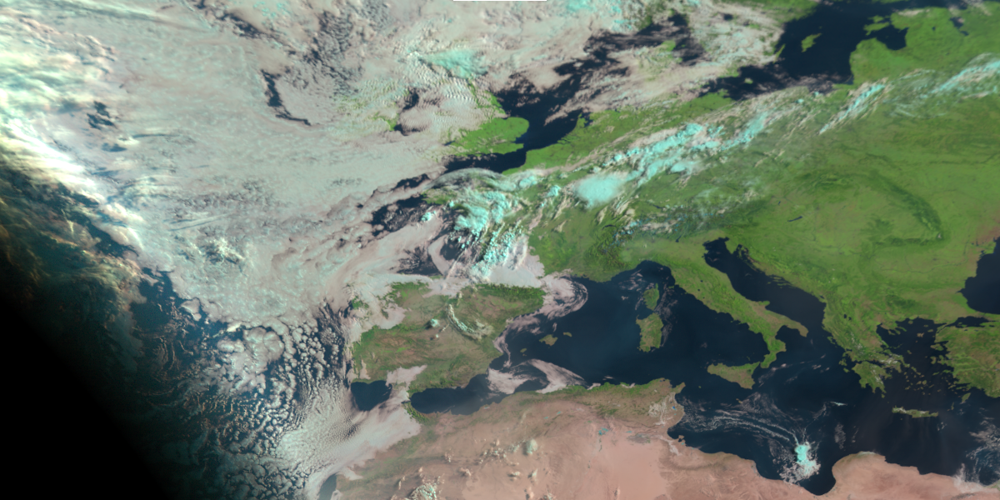

In [208]:
grid_scn.show("natural_color")

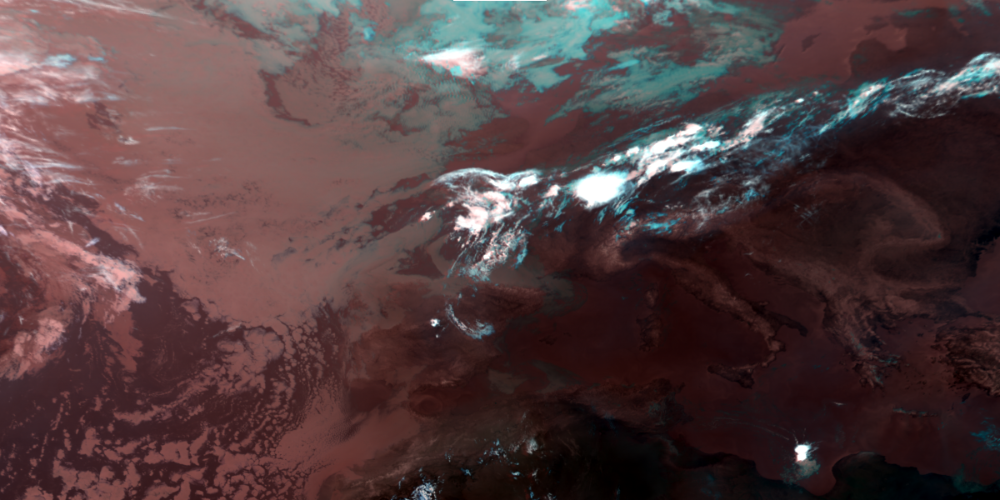

In [209]:
grid_scn.show("cloudtop")

In [398]:
from satpy.composites import GenericCompositor

In [399]:
daynight = GenericCompositor("cloudtop_daynight")

In [437]:
test_scn = Scene([files[6]], reader="seviri_l1b_native")

In [438]:
test_scn.all_dataset_names()[1:]

['IR_016',
 'IR_039',
 'IR_087',
 'IR_097',
 'IR_108',
 'IR_120',
 'IR_134',
 'VIS006',
 'VIS008',
 'WV_062',
 'WV_073']

In [439]:
test_scn.all_composite_names()

['airmass',
 'ash',
 'cloud_phase_distinction',
 'cloud_phase_distinction_raw',
 'cloudtop',
 'cloudtop_daytime',
 'colorized_ir_clouds',
 'convection',
 'day_microphysics',
 'day_microphysics_winter',
 'dust',
 'fog',
 'green_snow',
 'hrv_clouds',
 'hrv_fog',
 'hrv_severe_storms',
 'hrv_severe_storms_masked',
 'ir108_3d',
 'ir_cloud_day',
 'ir_overview',
 'ir_sandwich',
 'natural_color',
 'natural_color_nocorr',
 'natural_color_raw',
 'natural_color_raw_with_night_ir',
 'natural_color_with_night_ir',
 'natural_color_with_night_ir_hires',
 'natural_enh',
 'natural_enh_with_night_ir',
 'natural_enh_with_night_ir_hires',
 'natural_with_night_fog',
 'night_fog',
 'night_ir_alpha',
 'night_ir_with_background',
 'night_ir_with_background_hires',
 'night_microphysics',
 'overview',
 'overview_raw',
 'realistic_colors',
 'rocket_plume_day',
 'rocket_plume_night',
 'snow',
 'vis_sharpened_ir']

In [467]:
test_scn.load(["natural_color", "airmass", "cloudtop"]+test_scn.all_dataset_names()[1:]) 

In [468]:
test_grid_scn = test_scn.resample(Europe_grid, resampler="bilinear")

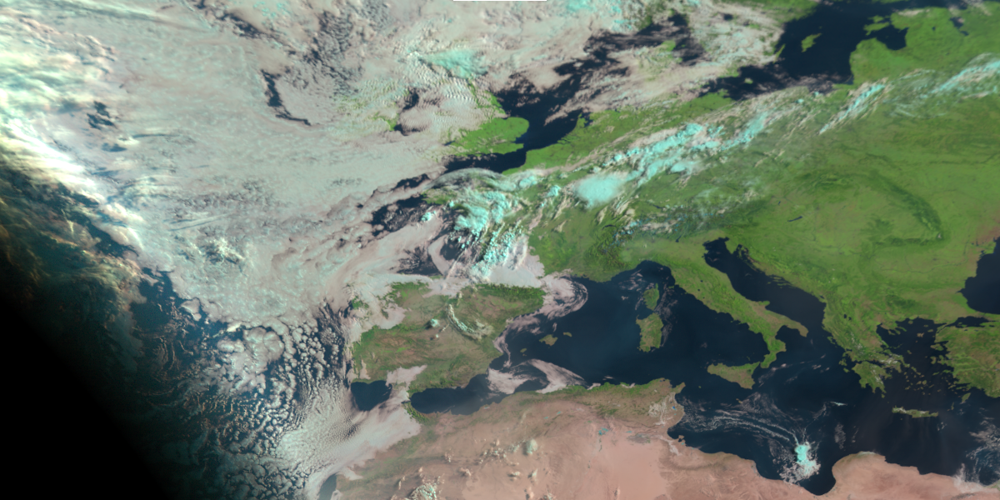

In [469]:
test_grid_scn.show("natural_color")

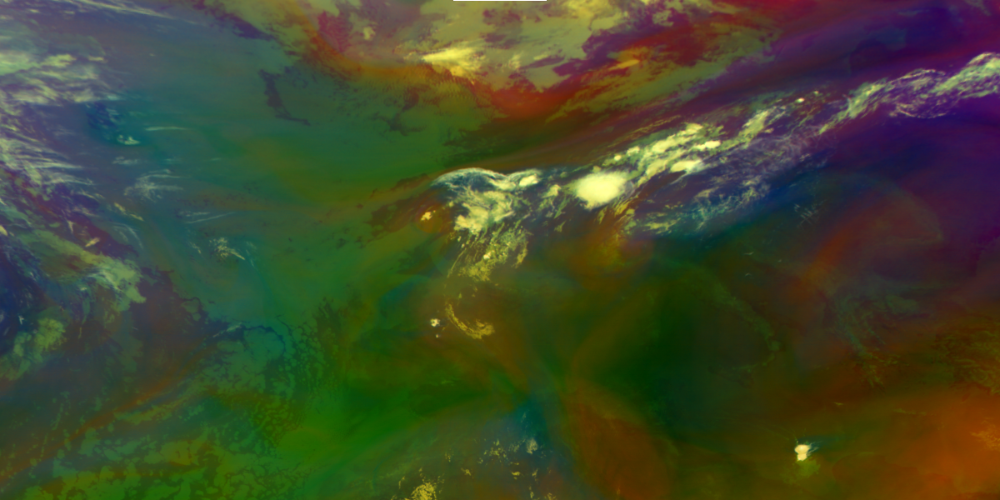

In [470]:
test_grid_scn.show("airmass")

In [428]:
daynight([test_grid_scn["IR_087"], test_grid_scn["IR_108"], test_grid_scn["IR_120"]]).values.shape

(3, 600, 1200)

In [429]:
np.nanmin(daynight([test_grid_scn["IR_087"], test_grid_scn["IR_108"], test_grid_scn["IR_120"]]).values, (1,2))

array([219.09513147, 218.61195086, 218.45931421])

In [430]:
np.nanmax(daynight([test_grid_scn["IR_087"], test_grid_scn["IR_108"], test_grid_scn["IR_120"]]).values, (1,2))

array([299.36813539, 302.08830241, 300.77176596])

In [544]:
np.nanmax(daynight([test_grid_scn["IR_039"], test_grid_scn["IR_108"], test_grid_scn["IR_120"]]).values, (1,2))

array([306.99308802, 302.08830241, 300.77176596])

In [545]:
np.nanmin(daynight([test_grid_scn["IR_039"], test_grid_scn["IR_108"], test_grid_scn["IR_120"]]).values, (1,2))

array([241.93887759, 218.61195086, 218.45931421])

In [412]:
from satpy.writers import to_image

In [533]:
img = to_image(
    daynight([test_grid_scn["IR_097"], test_grid_scn["IR_108"], test_grid_scn["IR_120"]])
)
img.stretch(min_stretch=[225, 220, 220], max_stretch=[270, 300, 295])
# img.stretch(stretch="linear", cutoffs=[0.005, 0.005])

img.invert(True)

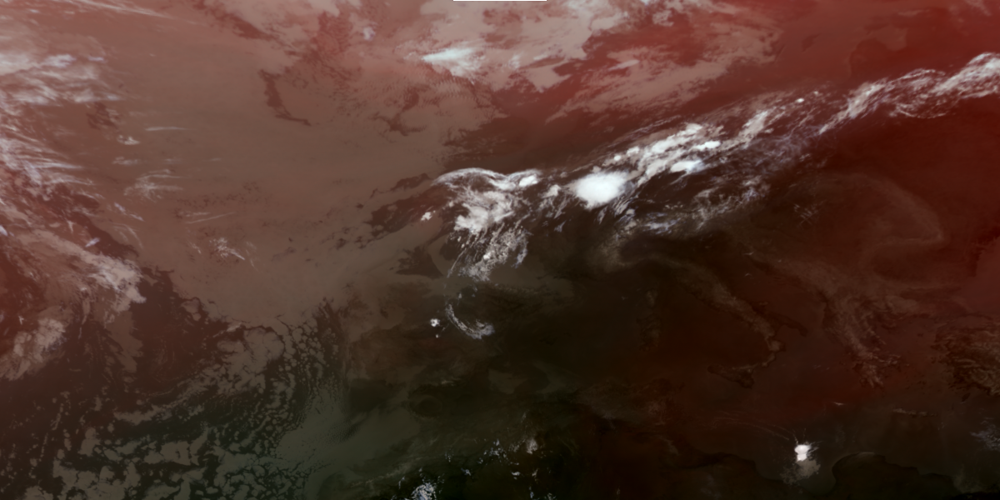

In [534]:
img

In [556]:
img = to_image(test_grid_scn["cloudtop"])
img.stretch(min_stretch=[245, 220, 225], max_stretch=[310, 300, 295])
img.invert(True)

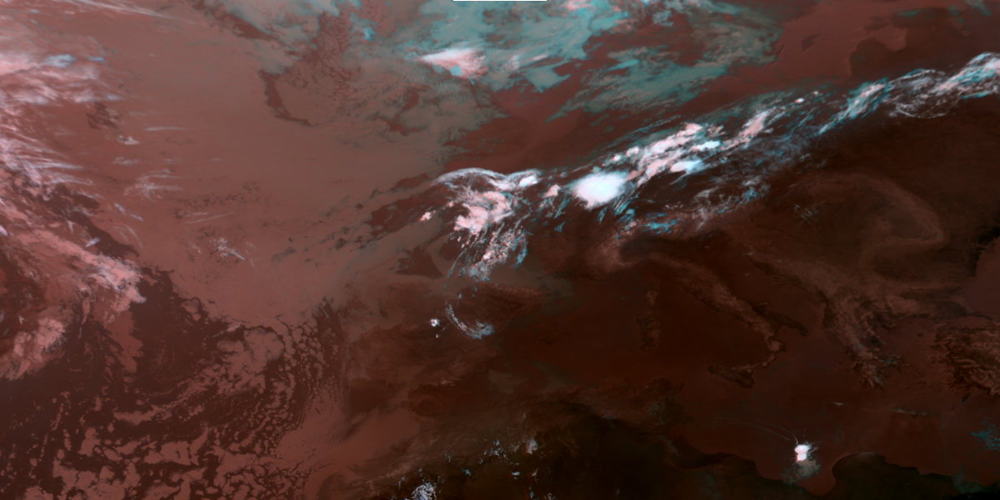

In [557]:
img

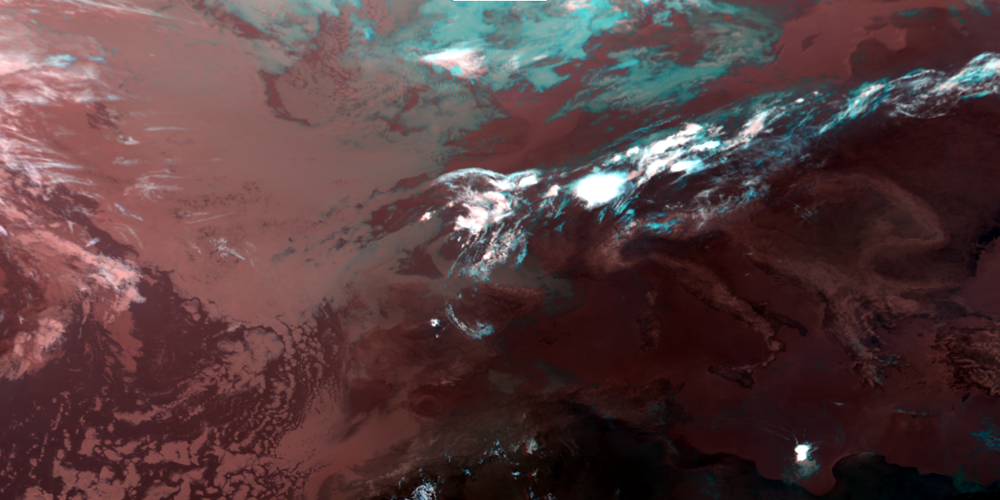

In [464]:
img

In [419]:
img.data.values

array([[[0.49934726, 0.50552421, 0.5061753 , ..., 0.6720169 ,
         0.67269548, 0.67493877],
        [0.49672014, 0.50350437, 0.51102753, ..., 0.67538643,
         0.67367126, 0.67449605],
        [0.49705539, 0.49676959, 0.50316058, ..., 0.67930862,
         0.67664531, 0.67559236],
        ...,
        [0.74568056, 0.74367403, 0.74608033, ..., 0.78557501,
         0.78437615, 0.79204051],
        [0.74405555, 0.74672988, 0.74659462, ..., 0.77503736,
         0.77920097, 0.79196978],
        [0.73898881, 0.74763334, 0.74865003, ..., 0.7714545 ,
         0.77184251, 0.77885394]],

       [[0.52252147, 0.52700213, 0.52426876, ..., 0.70594027,
         0.70640662, 0.70808467],
        [0.51849054, 0.52596842, 0.53563713, ..., 0.70807766,
         0.70671323, 0.70691273],
        [0.51768704, 0.51879166, 0.52742688, ..., 0.7105901 ,
         0.70845681, 0.7070758 ],
        ...,
        [0.76549064, 0.76517941, 0.76586734, ..., 0.85073585,
         0.8499496 , 0.84869969],
        [0.7

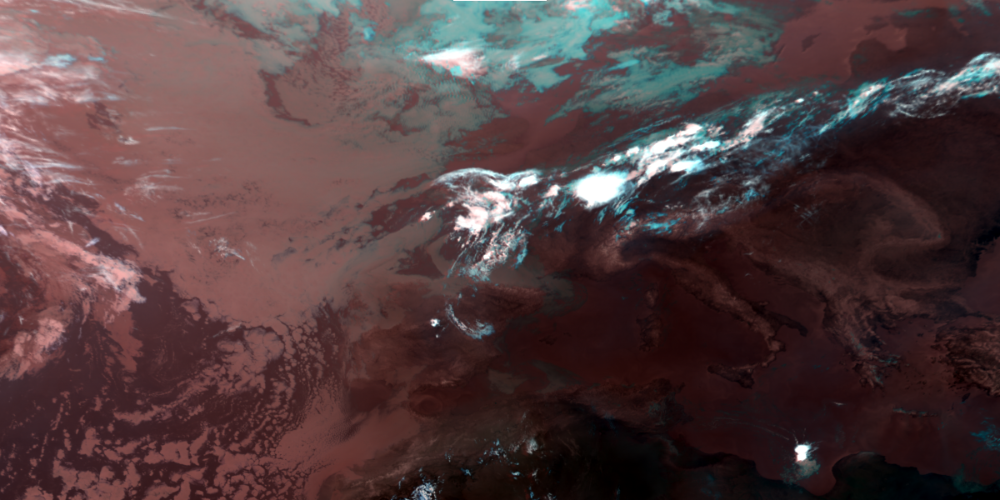

In [397]:
grid_scn.show("cloudtop")

In [206]:
grid_scn.show("natural_color").data.values

array([[[0.75228614, 0.7156112 , 0.7138554 , ..., 0.14901915,
         0.15348384, 0.13943608],
        [0.72727823, 0.7183747 , 0.7183747 , ..., 0.19778815,
         0.19778815, 0.1786432 ],
        [0.72727823, 0.7183747 , 0.68769586, ..., 0.22234373,
         0.19778815, 0.1786432 ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.7032173 ,
         0.7105607 , 0.6172293 ],
        [0.        , 0.        , 0.        , ..., 0.71105605,
         0.68716836, 0.64119625],
        [0.        , 0.        , 0.        , ..., 0.69820935,
         0.70688164, 0.69074667]],

       [[0.8812068 , 0.8480758 , 0.8270247 , ..., 0.26485804,
         0.27343085, 0.26458445],
        [0.84074897, 0.83866256, 0.83866256, ..., 0.31141233,
         0.31141233, 0.28451923],
        [0.84074897, 0.83866256, 0.8108051 , ..., 0.34143767,
         0.31141233, 0.28451923],
        ...,
        [0.        , 0.        , 0.        , ..., 0.56304246,
         0.56897277, 0.51562786],
        [0. 

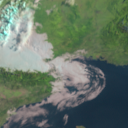

In [232]:
grid_scn.crop(xy_bbox=[0, 40, 6.36, 46.34]).show("natural_color")

In [233]:
cropped_img = grid_scn.crop(xy_bbox=[0, 40, 6.36, 46.34]).show("natural_color")

In [234]:
import numpy as np

In [258]:
lon = np.random.uniform(low=-30+3.2, high=30-3.2)
lat = np.random.uniform(low=30+3.2, high=60-3.2)

lon = np.round(lon/0.05)*0.05
lat = np.round(lat/0.05)*0.05

In [259]:
lon ,lat

(-17.95, 39.400000000000006)

In [260]:
grid_scn.crop(xy_bbox=[lon-3.18, lat-3.17, lon+3.18, lat+3.17]).show("natural_color").data

<xarray.DataArray 'reshape-9f10c49ccc2e69320312d424bd57ff10' (bands: 3, y: 128,
                                                              x: 128)>
dask.array<pow, shape=(3, 128, 128), dtype=float64, chunksize=(3, 128, 128), chunktype=numpy.ndarray>
Coordinates:
  * x        (x) float64 -21.12 -21.08 -21.02 -20.98 ... -14.88 -14.83 -14.78
  * y        (y) float64 42.58 42.53 42.48 42.42 ... 36.38 36.33 36.27 36.23
    crs      object GEOGCRS["WGS 84",ENSEMBLE["World Geodetic System 1984 ens...
  * bands    (bands) <U1 'R' 'G' 'B'
Attributes: (12/22)
    time_parameters:                        {'nominal_start_time': datetime.d...
    platform_name:                          Meteosat-11
    georef_offset_corrected:                True
    orbital_parameters:                     {'projection_longitude': 0.0, 'pr...
    resolution:                             3000.403165817
    area:                                   Area ID: Europe_0.05_grid\nDescri...
    ...                                     ...
    name:                                   natural_color
    _satpy_id:                              DataID(name='natural_color', reso...
    prerequisites:                          [DataQuery(name='IR_016', modifie...
    optional_prerequisites:                 []
    mode:                                   RGB
    enhancement_history:                    [{'scale': 0.008333333333333333, ...

In [263]:
for i in range(100):
    lon = np.random.uniform(low=-30+3.2, high=30-3.2)
    lat = np.random.uniform(low=30+3.2, high=60-3.2)
    lon = np.round(lon/0.05)*0.05
    lat = np.round(lat/0.05)*0.05
    shape = grid_scn.crop(xy_bbox=[lon-3.18, lat-3.16, lon+3.18, lat+3.16]).show("natural_color").data.shape
    print(shape)
    if shape[1]!=128 or shape[2]!=128:
        print(lon, lat)
        break

(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 12

In [264]:
shape == (3,128,128)

True

In [239]:
grid_scn.to_xarray()

<xarray.Dataset>
Dimensions:              (x: 1200, y: 600, bands: 3)
Coordinates:
  * x                    (x) float64 -29.98 -29.93 -29.88 ... 29.88 29.93 29.98
  * y                    (y) float64 59.98 59.93 59.88 ... 30.12 30.07 30.02
  * bands                (bands) <U1 'R' 'G' 'B'
    longitude            (y, x) float64 dask.array<chunksize=(600, 1200), meta=np.ndarray>
    latitude             (y, x) float64 dask.array<chunksize=(600, 1200), meta=np.ndarray>
Data variables:
    Europe_0.05_grid     int64 0
    cloudtop             (bands, y, x) float64 dask.array<chunksize=(3, 600, 1200), meta=np.ndarray>
    colorized_ir_clouds  (y, x) float64 dask.array<chunksize=(600, 1200), meta=np.ndarray>
    natural_color        (bands, y, x) float64 dask.array<chunksize=(3, 600, 1200), meta=np.ndarray>
    natural_enh          (bands, y, x) float64 dask.array<chunksize=(3, 600, 1200), meta=np.ndarray>
Attributes:
    history:      Created by pytroll/satpy on 2024-11-20 10:13:49.991343
    Conventions:  CF-1.7

In [270]:
str(seviri_files[0]).split("/")[-1].split("-")[-2][:10]

'2019070223'

In [500]:
import warnings

def get_random_lonlat(resolution=0.05, offset=3.2, number=1):
    lons = np.arange(-30+offset, 30-offset, resolution)
    lats = np.arange(30+offset, 60-offset, resolution)
    return np.random.choice(lons, number), np.random.choice(lats, number)
    
def create_nightvision_patches(filename, save_path, number_of_patches=1, patch_size=128, resolution=0.05):
    filename = str(filename)
    save_path = pathlib.Path(save_path)
    
    scene = Scene([filename], reader="seviri_l1b_native")
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        scene.load(["cloudtop", "natural_color"], unload=True) 

    europe_grid = AreaDefinition(
        "Europe_grid", 
        "Europe equal latitude/longitude grid", 
        "longlat",
        projection="4326",
        width=int(60/resolution), height=int(30/resolution), area_extent=(-30,30,30,60)
    )
    
    grid_scene = scene.resample(europe_grid, resampler="bilinear")

    offset = patch_size/2 * resolution
    lon_slice_offset = resolution*0.25
    lat_slice_offset = resolution*0.75

    lons, lats = get_random_lonlat(resolution=resolution, offset=offset, number=number_of_patches)
    for lon, lat in zip(lons, lats):
        crop_scene = grid_scene.crop(xy_bbox=[
            lon-offset+lon_slice_offset, 
            lat-offset+lat_slice_offset, 
            lon+offset-lon_slice_offset, 
            lat+offset-lat_slice_offset
        ])
        assert crop_scene.to_xarray().natural_color.shape == (3, patch_size, patch_size), f'Patch size: {crop_scene.to_xarray().natural_color.shape}'

        save_id = f'{filename.split("/")[-1].split("-")[-2][:10]}0000_{lon:05.2f}_{lat:05.2f}.png'

        img = to_image(crop_scene["cloudtop"])
        img.stretch(min_stretch=[245, 220, 225], max_stretch=[310, 300, 295])
        img.invert(True)
        img.save(
            save_path / f'cloudtop_{save_id}'
        )
    
        crop_scene.show("natural_color").save(
            save_path / f'natural_color_{save_id}'
        )
    

In [501]:
! rm *.png

In [502]:
create_nightvision_patches(
    files[6], "./", number_of_patches=10, patch_size=128, resolution=0.1
)

In [503]:
!ls .

cloudtop_20190701060000_00.60_51.60.png
cloudtop_20190701060000_-11.00_50.30.png
cloudtop_20190701060000_11.40_45.20.png
cloudtop_20190701060000_13.50_43.80.png
cloudtop_20190701060000_-19.40_38.00.png
cloudtop_20190701060000_-20.00_49.50.png
cloudtop_20190701060000_-21.50_45.00.png
cloudtop_20190701060000_-22.60_48.60.png
cloudtop_20190701060000_-3.30_51.00.png
cloudtop_20190701060000_-9.00_40.10.png
generate_seviri_patches.py
generate_seviri_patches_runner.sh
log_files
natural_color_20190701060000_00.60_51.60.png
natural_color_20190701060000_-11.00_50.30.png
natural_color_20190701060000_11.40_45.20.png
natural_color_20190701060000_13.50_43.80.png
natural_color_20190701060000_-19.40_38.00.png
natural_color_20190701060000_-20.00_49.50.png
natural_color_20190701060000_-21.50_45.00.png
natural_color_20190701060000_-22.60_48.60.png
natural_color_20190701060000_-3.30_51.00.png
natural_color_20190701060000_-9.00_40.10.png
process_seviri_patches.ipynb


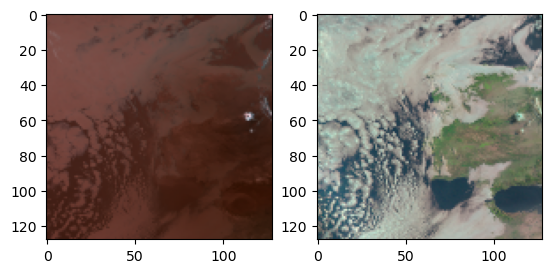

In [505]:
fig, axes = plt.subplots(1, 2)

axes[0].imshow(plt.imread("cloudtop_20190701060000_-9.00_40.10.png"))

axes[1].imshow(plt.imread("natural_color_20190701060000_-9.00_40.10.png"))

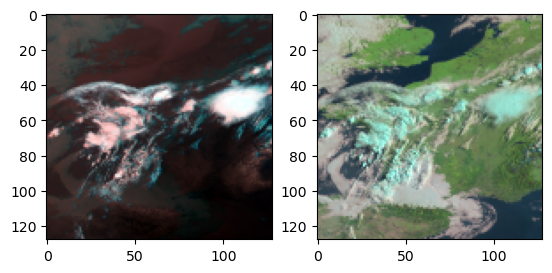

In [337]:
fig, axes = plt.subplots(1, 2)

axes[0].imshow(plt.imread("cloudtop_20190701060000_01.50_47.40.png"))

axes[1].imshow(plt.imread("natural_color_20190701060000_01.50_47.40.png"))

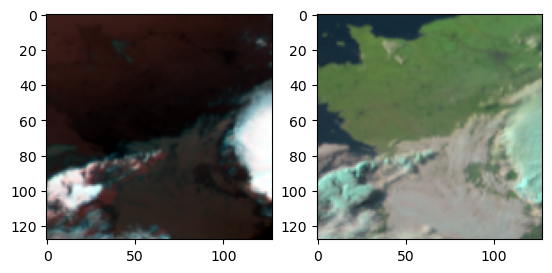

In [311]:
fig, axes = plt.subplots(1, 2)

axes[0].imshow(plt.imread("cloudtop_2019070118_00.40_46.85_09.png"))

axes[1].imshow(plt.imread("natural_color_2019070118_00.40_46.85_09.png"))

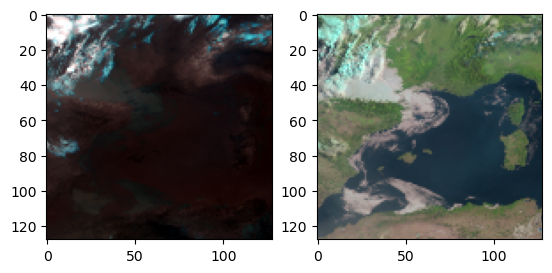

In [308]:
fig, axes = plt.subplots(1, 2)

axes[0].imshow(plt.imread("cloudtop_2019070106_04.20_41.40_04.png"))

axes[1].imshow(plt.imread("natural_color_2019070106_04.20_41.40_04.png"))

In [338]:
! pwd

/home/users/wkjones/python/IECDT_EarthObservation/data_processing/2-nightvision


In [340]:
! ls ../../data

1-sunny-oxford


In [341]:
! mkdir ../../data/2-nightvision

In [342]:
for file in files:
    create_nightvision_patches(
        file, "/work/scratch-nopw2/iecdt_ai4eo/preprocessing/nightvision_patches", number_of_patches=1, patch_size=128, resolution=0.1
    )

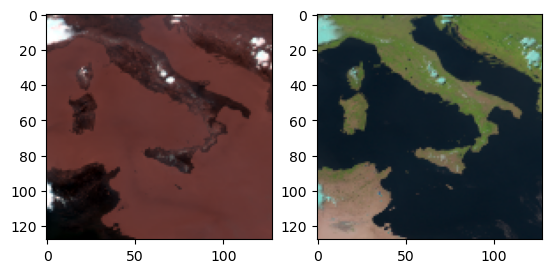

In [343]:
fig, axes = plt.subplots(1, 2)

axes[0].imshow(plt.imread("/work/scratch-nopw2/iecdt_ai4eo/preprocessing/nightvision_patches/cloudtop_20190702140000_13.30_39.40.png"))

axes[1].imshow(plt.imread("/work/scratch-nopw2/iecdt_ai4eo/preprocessing/nightvision_patches/natural_color_20190702140000_13.30_39.40.png"))

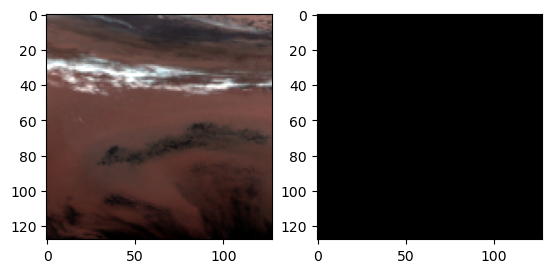

In [344]:
fig, axes = plt.subplots(1, 2)

axes[0].imshow(plt.imread("/work/scratch-nopw2/iecdt_ai4eo/preprocessing/nightvision_patches/cloudtop_20190101000000_-13.40_51.40.png"))

axes[1].imshow(plt.imread("/work/scratch-nopw2/iecdt_ai4eo/preprocessing/nightvision_patches/natural_color_20190101000000_-13.40_51.40.png"))


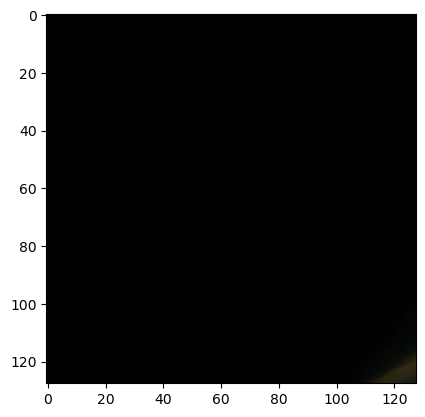

In [346]:
plt.imshow(plt.imread("/work/scratch-nopw2/iecdt_ai4eo/preprocessing/nightvision_patches/natural_color_20190101060000_14.60_52.40.png"))

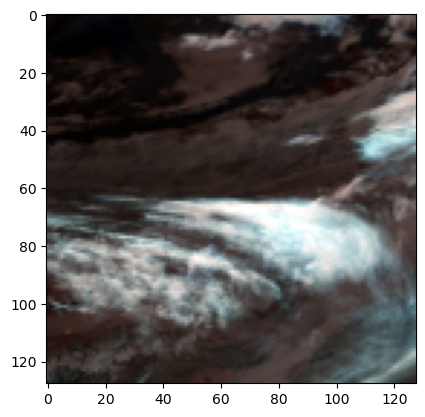

In [348]:
plt.imshow(plt.imread("/work/scratch-nopw2/iecdt_ai4eo/preprocessing/nightvision_patches/cloudtop_20190101060000_14.60_52.40.png"))

In [558]:
patch_dir = pathlib.Path("/work/scratch-nopw2/iecdt_ai4eo/preprocessing/nightvision_patches/")

In [559]:
cloudtop_patches = sorted(list(patch_dir.glob("cloudtop_*.png")))

In [560]:
len(cloudtop_patches)

8760

In [561]:
truecolour_patches = sorted(list(patch_dir.glob("natural_color_*.png")))

In [562]:
len(truecolour_patches)

8760

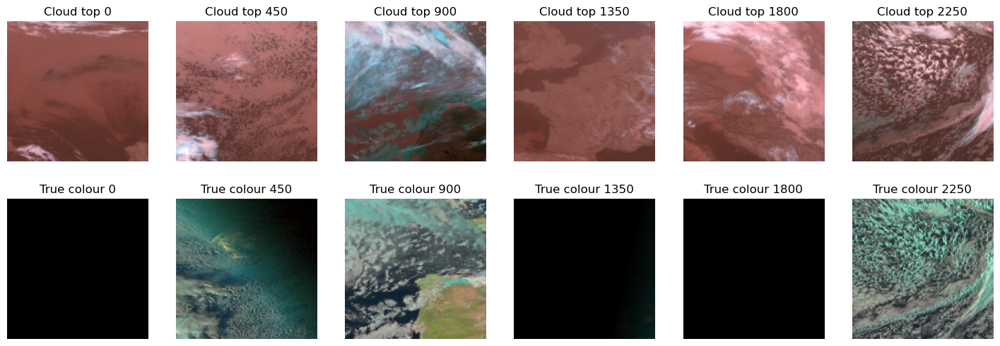

In [563]:
fig, axes = plt.subplots(2, 6, figsize=(18,6))

for i in range(6):
    axes[0, i].imshow(plt.imread(cloudtop_patches[i*450]))
    axes[0, i].set_axis_off()
    axes[0, i].set_title(f'Cloud top {i*450}')
    axes[1, i].imshow(plt.imread(truecolour_patches[i*450]))
    axes[1, i].set_axis_off()
    axes[1, i].set_title(f'True colour {i*450}')

In [564]:
patches_metadata = pd.DataFrame(
    dict(
        cloudtop_patches_original=cloudtop_patches, 
        truecolour_patches_original=truecolour_patches
    )
)

In [565]:
patches_metadata

,cloudtop_patches_original,truecolour_patches_original
0,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...
1,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...
2,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...
3,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...
4,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...
...,...,...
8755,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...
8756,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...
8757,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...
8758,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...


In [566]:
patches_metadata["cloudtop_file"] = [
    f'cloudtop_{idx}.png' for idx in patches_metadata.index
]

In [567]:
patches_metadata["truecolour_file"] = [
    f'truecolour_{idx}.png' for idx in patches_metadata.index
]

In [568]:
patches_metadata

,cloudtop_patches_original,truecolour_patches_original,cloudtop_file,truecolour_file
0,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_0.png,truecolour_0.png
1,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_1.png,truecolour_1.png
2,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_2.png,truecolour_2.png
3,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_3.png,truecolour_3.png
4,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_4.png,truecolour_4.png
...,...,...,...,...
8755,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_8755.png,truecolour_8755.png
8756,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_8756.png,truecolour_8756.png
8757,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_8757.png,truecolour_8757.png
8758,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_8758.png,truecolour_8758.png


In [569]:
metadata = [f.stem.split("_")[-3:] for f in patches_metadata.cloudtop_patches_original]

In [570]:
metadata_check = [f.stem.split("_")[-3:] for f in patches_metadata.truecolour_patches_original]

In [571]:
metadata == metadata_check

True

In [572]:
pd.DataFrame(metadata, columns=["date", "longitude", "latitude"])

,date,longitude,latitude
0,20190101000000,-13.50,48.30
1,20190101010000,-17.50,37.00
2,20190101020000,19.00,46.70
3,20190101030000,-17.30,52.70
4,20190101040000,-20.50,50.40
...,...,...,...
8755,20191231190000,-16.70,47.10
8756,20191231200000,03.00,46.50
8757,20191231210000,-23.00,52.60
8758,20191231220000,-8.00,41.40


In [573]:
patches_metadata = patches_metadata.join(pd.DataFrame(metadata, columns=["date", "longitude", "latitude"]))

In [574]:
patches_metadata

,cloudtop_patches_original,truecolour_patches_original,cloudtop_file,truecolour_file,date,longitude,latitude
0,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_0.png,truecolour_0.png,20190101000000,-13.50,48.30
1,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_1.png,truecolour_1.png,20190101010000,-17.50,37.00
2,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_2.png,truecolour_2.png,20190101020000,19.00,46.70
3,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_3.png,truecolour_3.png,20190101030000,-17.30,52.70
4,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_4.png,truecolour_4.png,20190101040000,-20.50,50.40
...,...,...,...,...,...,...,...
8755,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_8755.png,truecolour_8755.png,20191231190000,-16.70,47.10
8756,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_8756.png,truecolour_8756.png,20191231200000,03.00,46.50
8757,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_8757.png,truecolour_8757.png,20191231210000,-23.00,52.60
8758,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_8758.png,truecolour_8758.png,20191231220000,-8.00,41.40


In [575]:
patches_metadata["date"] = [datetime.strptime(date, "%Y%m%d%H%M%S") for date in patches_metadata["date"]]

In [576]:
patches_metadata

,cloudtop_patches_original,truecolour_patches_original,cloudtop_file,truecolour_file,date,longitude,latitude
0,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_0.png,truecolour_0.png,2019-01-01 00:00:00,-13.50,48.30
1,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_1.png,truecolour_1.png,2019-01-01 01:00:00,-17.50,37.00
2,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_2.png,truecolour_2.png,2019-01-01 02:00:00,19.00,46.70
3,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_3.png,truecolour_3.png,2019-01-01 03:00:00,-17.30,52.70
4,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_4.png,truecolour_4.png,2019-01-01 04:00:00,-20.50,50.40
...,...,...,...,...,...,...,...
8755,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_8755.png,truecolour_8755.png,2019-12-31 19:00:00,-16.70,47.10
8756,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_8756.png,truecolour_8756.png,2019-12-31 20:00:00,03.00,46.50
8757,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_8757.png,truecolour_8757.png,2019-12-31 21:00:00,-23.00,52.60
8758,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,/work/scratch-nopw2/iecdt_ai4eo/preprocessing/...,cloudtop_8758.png,truecolour_8758.png,2019-12-31 22:00:00,-8.00,41.40


In [577]:
cloudtop_patch_path = pathlib.Path("/work/scratch-nopw2/iecdt_ai4eo/data/2-nightvision/cloudtop_patches")
truecolour_patch_path = pathlib.Path("/work/scratch-nopw2/iecdt_ai4eo/data/2-nightvision/truecolour_patches")


In [1]:
for cloudtop_file, destination in zip(
    patches_metadata["cloudtop_patches_original"], 
    patches_metadata["cloudtop_file"]
):
    (cloudtop_patch_path/destination).rename(cloudtop_file)

NameError: name 'patches_metadata' is not defined

In [578]:
for cloudtop_file, destination in zip(
    patches_metadata["cloudtop_patches_original"], 
    patches_metadata["cloudtop_file"]
):
    cloudtop_file.rename(cloudtop_patch_path/destination)

In [579]:
for truecolour_file, destination in zip(
    patches_metadata["truecolour_patches_original"], 
    patches_metadata["truecolour_file"]
):
    truecolour_file.rename(truecolour_patch_path/destination)

In [580]:
patches_metadata.drop(["cloudtop_patches_original", "truecolour_patches_original"], axis="columns").to_csv(
    "/work/scratch-nopw2/iecdt_ai4eo/data/2-nightvision/metadata.csv", index=False
)

In [2]:
import pandas as pd

In [4]:
patches_metadata = pd.read_csv("/work/scratch-nopw2/iecdt_ai4eo/data/2-nightvision/metadata.csv")

In [5]:
patches_metadata

,cloudtop_file,truecolour_file,date,longitude,latitude
0,cloudtop_0.png,truecolour_0.png,2019-01-01 00:00:00,-13.5,48.3
1,cloudtop_1.png,truecolour_1.png,2019-01-01 01:00:00,-17.5,37.0
2,cloudtop_2.png,truecolour_2.png,2019-01-01 02:00:00,19.0,46.7
3,cloudtop_3.png,truecolour_3.png,2019-01-01 03:00:00,-17.3,52.7
4,cloudtop_4.png,truecolour_4.png,2019-01-01 04:00:00,-20.5,50.4
...,...,...,...,...,...
8755,cloudtop_8755.png,truecolour_8755.png,2019-12-31 19:00:00,-16.7,47.1
8756,cloudtop_8756.png,truecolour_8756.png,2019-12-31 20:00:00,3.0,46.5
8757,cloudtop_8757.png,truecolour_8757.png,2019-12-31 21:00:00,-23.0,52.6
8758,cloudtop_8758.png,truecolour_8758.png,2019-12-31 22:00:00,-8.0,41.4


In [6]:
patches_metadata["cloudtop_file_old"] = patches_metadata.cloudtop_file
patches_metadata["truecolour_file_old"] = patches_metadata.truecolour_file


In [7]:
patches_metadata["cloudtop_file"] = [
    f'cloudtop_{idx:04d}.png' for idx in patches_metadata.index
]

patches_metadata["natural_colour_file"] = [
    f'natural_colour_{idx:04d}.png' for idx in patches_metadata.index
]

In [8]:
patches_metadata

,cloudtop_file,truecolour_file,date,longitude,latitude,cloudtop_file_old,truecolour_file_old,natural_colour_file
0,cloudtop_0000.png,truecolour_0.png,2019-01-01 00:00:00,-13.5,48.3,cloudtop_0.png,truecolour_0.png,natural_colour_0000.png
1,cloudtop_0001.png,truecolour_1.png,2019-01-01 01:00:00,-17.5,37.0,cloudtop_1.png,truecolour_1.png,natural_colour_0001.png
2,cloudtop_0002.png,truecolour_2.png,2019-01-01 02:00:00,19.0,46.7,cloudtop_2.png,truecolour_2.png,natural_colour_0002.png
3,cloudtop_0003.png,truecolour_3.png,2019-01-01 03:00:00,-17.3,52.7,cloudtop_3.png,truecolour_3.png,natural_colour_0003.png
4,cloudtop_0004.png,truecolour_4.png,2019-01-01 04:00:00,-20.5,50.4,cloudtop_4.png,truecolour_4.png,natural_colour_0004.png
...,...,...,...,...,...,...,...,...
8755,cloudtop_8755.png,truecolour_8755.png,2019-12-31 19:00:00,-16.7,47.1,cloudtop_8755.png,truecolour_8755.png,natural_colour_8755.png
8756,cloudtop_8756.png,truecolour_8756.png,2019-12-31 20:00:00,3.0,46.5,cloudtop_8756.png,truecolour_8756.png,natural_colour_8756.png
8757,cloudtop_8757.png,truecolour_8757.png,2019-12-31 21:00:00,-23.0,52.6,cloudtop_8757.png,truecolour_8757.png,natural_colour_8757.png
8758,cloudtop_8758.png,truecolour_8758.png,2019-12-31 22:00:00,-8.0,41.4,cloudtop_8758.png,truecolour_8758.png,natural_colour_8758.png


In [10]:
import pathlib
cloudtop_patch_path = pathlib.Path("/work/scratch-nopw2/iecdt_ai4eo/data/2-nightvision/cloudtop_patches")
truecolour_patch_path = pathlib.Path("/work/scratch-nopw2/iecdt_ai4eo/data/2-nightvision/truecolour_patches")
natural_colour_patch_path = pathlib.Path("/work/scratch-nopw2/iecdt_ai4eo/data/2-nightvision/natural_colour_patches")
natural_colour_patch_path.mkdir(exist_ok=True)

In [12]:
for cloudtop_file, destination in zip(
    patches_metadata["cloudtop_file_old"], 
    patches_metadata["cloudtop_file"]
):
    (cloudtop_patch_path/cloudtop_file).rename(cloudtop_patch_path/destination)

In [13]:
for truecolour_file, destination in zip(
    patches_metadata["truecolour_file_old"], 
    patches_metadata["natural_colour_file"]
):
    (truecolour_patch_path/truecolour_file).rename(natural_colour_patch_path/destination)

In [16]:
patches_metadata = patches_metadata.drop(["truecolour_file", "cloudtop_file_old", "truecolour_file_old"], axis="columns")

In [19]:
patches_metadata = patches_metadata[["cloudtop_file", "natural_colour_file", "date", "longitude", "latitude"]]

In [20]:
patches_metadata.to_csv(
    "/work/scratch-nopw2/iecdt_ai4eo/data/2-nightvision/metadata.csv", index=False
)

In [21]:
pd.read_csv("/work/scratch-nopw2/iecdt_ai4eo/data/2-nightvision/metadata.csv")

,cloudtop_file,natural_colour_file,date,longitude,latitude
0,cloudtop_0000.png,natural_colour_0000.png,2019-01-01 00:00:00,-13.5,48.3
1,cloudtop_0001.png,natural_colour_0001.png,2019-01-01 01:00:00,-17.5,37.0
2,cloudtop_0002.png,natural_colour_0002.png,2019-01-01 02:00:00,19.0,46.7
3,cloudtop_0003.png,natural_colour_0003.png,2019-01-01 03:00:00,-17.3,52.7
4,cloudtop_0004.png,natural_colour_0004.png,2019-01-01 04:00:00,-20.5,50.4
...,...,...,...,...,...
8755,cloudtop_8755.png,natural_colour_8755.png,2019-12-31 19:00:00,-16.7,47.1
8756,cloudtop_8756.png,natural_colour_8756.png,2019-12-31 20:00:00,3.0,46.5
8757,cloudtop_8757.png,natural_colour_8757.png,2019-12-31 21:00:00,-23.0,52.6
8758,cloudtop_8758.png,natural_colour_8758.png,2019-12-31 22:00:00,-8.0,41.4
